# 영업 성공 여부 분류

## 1. 영업 성공 여부 분류 경진대회 개요
최근 기계학습 분야가 크게 발전하게 된 만큼 연구도 활발해져서 기존의 전통적인 모델보다 더 높은 성능을 내는 모델도 다수 등장하고 있습니다. 더불어서 영업 과정에서 전환 가능성이 높은 고객에게 영업 자원을 집중하기 위해 고객의 전환 여부를 예측하기 위해 기계학습을 도입하고 있습니다.

따라서 이번 경진대회에서는 고객의 다양한 정보를 보고 해당 고객이 전환 고객인지 아닌지를 판단하는 모델을 구현하고 그 성능을 비교하고자 합니다.

# 데이터 로딩

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import pycountry

plt.rcParams['font.family'] = 'DejaVu Sans'  # 여기서 원하는 글꼴로 변경하세요.

In [2]:
CI_df_train = pd.read_csv('./preprocessing_data/CI(고객관련정보)_train.csv')
SAI_df_train = pd.read_csv('./preprocessing_data/SAI(영업활동정보)_train.csv')
PSI_df_train = pd.read_csv('./preprocessing_data/PSI(상품밎서비스정보)_train.csv')
CII_df_train = pd.read_csv('./preprocessing_data/CII(고객상호작용정보)_train.csv')
BUR_df_train = pd.read_csv('./preprocessing_data/BUR(비즈니스단위및지역정보)_train.csv')
SWI_df_train = pd.read_csv('./preprocessing_data/SWI(전략적가중치정보)_train.csv')
PMI_df_train = pd.read_csv('./preprocessing_data/PMI(성과측정정보)_train.csv')
target_train = pd.read_csv('./preprocessing_data/target_train.csv')

In [3]:
# 가정: 모든 데이터프레임에 'customer_id'라는 공통된 열이 있다고 가정
df_train = CI_df_train
for df in [SAI_df_train, PSI_df_train, CII_df_train, BUR_df_train, SWI_df_train, PMI_df_train, target_train]:
    df_train = pd.merge(df_train, df, on='Unnamed: 0', how='left')

df_train = df_train.drop('Unnamed: 0', axis = 1)

In [4]:
df_train.to_csv('./preprocessing_data/df_train.csv')

In [5]:
CI_df_test = pd.read_csv('./preprocessing_data/CI(고객관련정보)_test.csv')
SAI_df_test = pd.read_csv('./preprocessing_data/SAI(영업활동정보)_test.csv')
PSI_df_test = pd.read_csv('./preprocessing_data/PSI(상품밎서비스정보)_test.csv')
CII_df_test = pd.read_csv('./preprocessing_data/CII(고객상호작용정보)_test.csv')
BUR_df_test = pd.read_csv('./preprocessing_data/BUR(비즈니스단위및지역정보)_test.csv')
SWI_df_test = pd.read_csv('./preprocessing_data/SWI(전략적가중치정보)_test.csv')
PMI_df_test = pd.read_csv('./preprocessing_data/PMI(성과측정정보)_test.csv')
target_test = pd.read_csv('./preprocessing_data/target_test.csv')

In [6]:
# 가정: 모든 데이터프레임에 'customer_id'라는 공통된 열이 있다고 가정
df_test = CI_df_test
for df in [SAI_df_test, PSI_df_test, CII_df_test, BUR_df_test, SWI_df_test, PMI_df_test, target_test]:
    df_test = pd.merge(df_test, df, on='Unnamed: 0', how='left')

df_test = df_test.drop('Unnamed: 0', axis = 1)

In [7]:
df_test.to_csv('./preprocessing_data/df_test.csv')

In [8]:
df_train.replace('Not Specified', np.nan, inplace=True)
df_test.replace('Not Specified', np.nan, inplace=True)

In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customer_country         53880 non-null  object 
 1   customer_idx             59299 non-null  int64  
 2   customer_type            15328 non-null  object 
 3   customer_job             38158 non-null  object 
 4   customer_position        33061 non-null  object 
 5   enterprise               59299 non-null  object 
 6   lead_owner               59299 non-null  int64  
 7   expected_timeline        28209 non-null  object 
 8   product_category         39925 non-null  object 
 9   product_subcategory      9235 non-null   object 
 10  product_modelname        9229 non-null   object 
 11  inquiry_type             58344 non-null  object 
 12  lead_desc_length         59299 non-null  int64  
 13  business_unit            59299 non-null  object 
 14  customer_country.1    

In [10]:
df_train

,customer_country,customer_idx,customer_type,customer_job,customer_position,enterprise,lead_owner,expected_timeline,product_category,product_subcategory,...,id_strategic_ver,it_strategic_ver,idit_strategic_ver,ver_cus,ver_pro,historical_existing_cnt,com_reg_ver_win_rate,ver_win_rate_x,ver_win_ratio_per_bu,is_converted
0,Philippines,32160,End Customer,Others,Student and Entry Level,Enterprise,0,Short Term (3 to 6 months),multi-split,NaN,...,0,0,0,1,0,0.0,0.066667,0.003079,0.026846,True
1,Philippines,23122,End Customer,Media and Communication,Executive Level,Enterprise,1,Short Term (3 to 6 months),multi-split,NaN,...,0,0,0,1,0,12.0,0.066667,0.003079,0.026846,True
2,India,1755,End Customer,Engineering and Technical,Other Roles,Enterprise,2,Short Term (3 to 6 months),single-split,NaN,...,0,0,0,1,0,144.0,0.088889,0.003079,0.026846,True
3,India,4919,End Customer,Creative and Design,Executive Level,Enterprise,3,Short Term (3 to 6 months),vrf,NaN,...,0,0,0,1,0,0.0,0.088889,0.003079,0.026846,True
4,India,17126,Specifier / Influencer,Others,Other Roles,Enterprise,4,Short Term (3 to 6 months),multi-split,NaN,...,0,0,0,0,0,0.0,0.088889,0.003079,0.026846,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59294,Poland,33747,End Customer,Engineering and Technical,Student and Entry Level,SMB,694,Short Term (3 to 6 months),vrf,NaN,...,0,0,0,0,0,0.0,0.000000,0.000026,0.028777,False
59295,Colombia,35420,Specifier / Influencer,Creative and Design,Student and Entry Level,Enterprise,39,Long Term (9 months to 1 year),etc.,NaN,...,0,0,0,0,0,0.0,0.040000,0.000026,0.028777,False
59296,Peru,19249,Specifier / Influencer,Engineering and Technical,Student and Entry Level,Enterprise,125,Short Term (3 to 6 months),single-split,NaN,...,0,0,0,0,0,0.0,0.040000,0.000026,0.028777,False
59297,Peru,40327,NaN,Creative and Design,Other Roles,Enterprise,134,Very Long Term (more than a year),etc.,NaN,...,0,0,0,0,0,0.0,0.040000,0.000026,0.028777,False


In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5271 entries, 0 to 5270
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customer_country         4900 non-null   object 
 1   customer_idx             5271 non-null   int64  
 2   customer_type            3814 non-null   object 
 3   customer_job             3424 non-null   object 
 4   customer_position        3289 non-null   object 
 5   enterprise               5271 non-null   object 
 6   lead_owner               5271 non-null   int64  
 7   expected_timeline        2863 non-null   object 
 8   product_category         3413 non-null   object 
 9   product_subcategory      793 non-null    object 
 10  product_modelname        562 non-null    object 
 11  inquiry_type             3979 non-null   object 
 12  lead_desc_length         5271 non-null   int64  
 13  business_unit            5271 non-null   object 
 14  customer_country.1      

In [12]:
df_test

,customer_country,customer_idx,customer_type,customer_job,customer_position,enterprise,lead_owner,expected_timeline,product_category,product_subcategory,...,id_strategic_ver,it_strategic_ver,idit_strategic_ver,ver_cus,ver_pro,historical_existing_cnt,com_reg_ver_win_rate,ver_win_rate_x,ver_win_ratio_per_bu,is_converted
0,Brazil,47466,End Customer,Others,NaN,Enterprise,278,NaN,NaN,NaN,...,0,0,0,1,0,53.0,0.073248,0.001183,0.049840,False
1,United States,5405,End Customer,NaN,NaN,SMB,437,NaN,NaN,NaN,...,0,0,0,0,0,0.0,0.000000,0.000013,0.000000,True
2,NaN,13597,Specifier / Influencer,Information Technology and Software,Management,SMB,874,Short Term (3 to 6 months),hospital tv,UT662M Series,...,0,0,0,0,0,0.0,0.000000,0.000060,0.131148,False
3,United States,17204,NaN,Service and Customer Support,NaN,Enterprise,194,Very Long Term (more than a year),NaN,Digital Signage or Commercial TVs,...,0,0,0,0,0,0.0,0.118644,0.001183,0.049840,False
4,Brazil,2329,End Customer,Engineering and Technical,Other Roles,Enterprise,167,Short Term (3 to 6 months),led signage,LG LED Bloc,...,1,0,1,1,1,2.0,0.074949,0.003079,0.064566,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5266,Brazil,40292,NaN,Service and Customer Support,Consulting and Advisory,Enterprise,97,NaN,NaN,NaN,...,0,0,0,0,0,10.0,0.000000,0.000000,0.000000,False
5267,United States,47466,NaN,NaN,NaN,Enterprise,438,NaN,NaN,NaN,...,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,True
5268,Brazil,46227,Specifier / Influencer,Creative and Design,Management,Enterprise,97,Short Term (3 to 6 months),multi-split,NaN,...,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,False
5269,Germany,45667,End Customer,NaN,NaN,SMB,429,NaN,cloud device,NaN,...,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,True


# 데이터 전처리

In [13]:
df_train['customer_idx'] = df_train['customer_idx'].astype(str)
df_test['customer_idx'] = df_test['customer_idx'].astype(str)

In [14]:
df_train['lead_owner'] = df_train['lead_owner'].astype(str)
df_test['lead_owner'] = df_test['lead_owner'].astype(str)

In [101]:
df_train.drop(['product_category','product_subcategory', 'product_modelname'], axis = 1, inplace =True)
df_test.drop(['product_category','product_subcategory', 'product_modelname'], axis = 1, inplace =True)

In [15]:
print(df_train['enterprise'].unique())
print(df_test['enterprise'].unique())

['Enterprise' 'SMB']
['Enterprise' 'SMB']


In [16]:
print(df_train['business_unit'].unique())
print(df_test['business_unit'].unique())

['AS' 'ID' 'IT' 'Solution' 'CM']
['ID' 'IT' 'AS']


In [17]:
# 'enterprise' 열을 이진 값으로 매핑
df_train['enterprise'] = df_train['enterprise'].map({'Enterprise': 0, 'SMB': 1}).astype('int64')
df_test['enterprise'] = df_test['enterprise'].map({'Enterprise': 0, 'SMB': 1}).astype('int64')

In [18]:
train_business_unit_dummies = pd.get_dummies(df_train['business_unit'], prefix='business_unit').astype('int64')
test_business_unit_dummies = pd.get_dummies(df_test['business_unit'], prefix='business_unit')

for column in train_business_unit_dummies.columns:
    if column not in test_business_unit_dummies:
        test_business_unit_dummies[column] = 0
        
test_business_unit_dummies = test_business_unit_dummies[train_business_unit_dummies.columns].astype('int64')

In [19]:

# 원-핫 인코딩된 데이터프레임을 df_test에 추가
df_train = pd.concat([df_train, train_business_unit_dummies], axis=1)

# 원-핫 인코딩된 데이터프레임을 df_test에 추가
df_test = pd.concat([df_test, test_business_unit_dummies], axis=1)

In [20]:
df_train

,customer_country,customer_idx,customer_type,customer_job,customer_position,enterprise,lead_owner,expected_timeline,product_category,product_subcategory,...,historical_existing_cnt,com_reg_ver_win_rate,ver_win_rate_x,ver_win_ratio_per_bu,is_converted,business_unit_AS,business_unit_CM,business_unit_ID,business_unit_IT,business_unit_Solution
0,Philippines,32160,End Customer,Others,Student and Entry Level,0,0,Short Term (3 to 6 months),multi-split,NaN,...,0.0,0.066667,0.003079,0.026846,True,1,0,0,0,0
1,Philippines,23122,End Customer,Media and Communication,Executive Level,0,1,Short Term (3 to 6 months),multi-split,NaN,...,12.0,0.066667,0.003079,0.026846,True,1,0,0,0,0
2,India,1755,End Customer,Engineering and Technical,Other Roles,0,2,Short Term (3 to 6 months),single-split,NaN,...,144.0,0.088889,0.003079,0.026846,True,1,0,0,0,0
3,India,4919,End Customer,Creative and Design,Executive Level,0,3,Short Term (3 to 6 months),vrf,NaN,...,0.0,0.088889,0.003079,0.026846,True,1,0,0,0,0
4,India,17126,Specifier / Influencer,Others,Other Roles,0,4,Short Term (3 to 6 months),multi-split,NaN,...,0.0,0.088889,0.003079,0.026846,True,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59294,Poland,33747,End Customer,Engineering and Technical,Student and Entry Level,1,694,Short Term (3 to 6 months),vrf,NaN,...,0.0,0.000000,0.000026,0.028777,False,1,0,0,0,0
59295,Colombia,35420,Specifier / Influencer,Creative and Design,Student and Entry Level,0,39,Long Term (9 months to 1 year),etc.,NaN,...,0.0,0.040000,0.000026,0.028777,False,1,0,0,0,0
59296,Peru,19249,Specifier / Influencer,Engineering and Technical,Student and Entry Level,0,125,Short Term (3 to 6 months),single-split,NaN,...,0.0,0.040000,0.000026,0.028777,False,1,0,0,0,0
59297,Peru,40327,NaN,Creative and Design,Other Roles,0,134,Very Long Term (more than a year),etc.,NaN,...,0.0,0.040000,0.000026,0.028777,False,1,0,0,0,0


In [21]:
# 1. 국가 일관성 변수 생성
df_train['p_country_consistency'] = (df_train['customer_country'] == df_train['customer_country.1']).astype(int)
df_test['p_country_consistency'] = (df_test['customer_country'] == df_test['customer_country.1']).astype(int)

In [22]:
# 1. 'customer_type' 컬럼의 결측치 처리
df_train['customer_type'] = df_train['customer_type'].fillna('Not Specified')
df_test['customer_type'] = df_test['customer_type'].fillna('Not Specified')

# 2. 전체 데이터셋에 대한 평균 영업 전환율 계산
overall_avg_conversion_rate = df_train['is_converted'].mean()

# 3. 고객 유형별 평균 영업 전환율 계산 및 파생 변수 생성
#customer_type_conversion_rates = df_train.groupby('customer_type')['is_converted'].mean().to_dict()
#df_train['p_customer_type_avg_conversion_rate'] = df_train['customer_type'].map(customer_type_conversion_rates)
#df_test['p_customer_type_avg_conversion_rate'] = df_test['customer_type'].map(customer_type_conversion_rates).fillna(np.mean(list(customer_type_conversion_rates.values())))

# 4. 고객 유형별 평균 전환율 대비 전체 평균 전환율의 차이 계산
#df_train['p_customer_type_conversion_rate_diff'] = df_train['p_customer_type_avg_conversion_rate'] - overall_avg_conversion_rate
#df_test['p_customer_type_conversion_rate_diff'] = df_test['p_customer_type_avg_conversion_rate'] - overall_avg_conversion_rate

# 테스트 데이터에서 결측값 처리
# 테스트 데이터에 결측값이 있는 경우, 전체 데이터셋의 평균 전환율 대비 차이의 평균값으로 대체
#df_test['p_customer_type_conversion_rate_diff'].fillna(df_test['p_customer_type_conversion_rate_diff'].mean(), inplace=True)

# 2. 'customer_type' 컬럼의 결측치 처리
df_train['customer_type'] = df_train['customer_type'].fillna('Unknown')
# 고객 유형별 평균 영업 전환율 계산 및 파생 변수 생성
customer_type_conversion_rates = df_train.groupby('customer_type')['is_converted'].mean().to_dict()
df_train['p_customer_type_avg_conversion_rate'] = df_train['customer_type'].map(customer_type_conversion_rates)
df_test['customer_type'] = df_test['customer_type'].fillna('Unknown')
# 테스트 데이터에는 트레이닝 데이터에서 계산한 값 매핑 (데이터 누수 방지)
df_test['p_customer_type_avg_conversion_rate'] = df_test['customer_type'].map(customer_type_conversion_rates).fillna(np.mean(list(customer_type_conversion_rates.values())))

In [23]:
#예산, 요구사항, 희망 납기일 등이 포함된 bant_submit은 다른 변수들과 결합하여 중요한 정보를 제공할 수 있습니다. 
#예를 들어, bant_submit과 historical_existing_cnt (이전에 전환된 횟수)를 곱하여, 고객의 요구사항 충족도와 이전 전환 경험의 상호작용을 나타내는 변수를 만들 수 있습니다.
df_train['p_bant_historical_interaction'] = df_train['bant_submit'] * df_train['historical_existing_cnt']
df_test['p_bant_historical_interaction'] = df_test['bant_submit'] * df_test['historical_existing_cnt']

In [24]:
# 고객의 역사적 상호작용 및 요구사항 충족도
df_train['p_interaction_fulfillment_ratio'] = (df_train['historical_existing_cnt'] + 1) * np.log1p(df_train['bant_submit'])
df_test['p_interaction_fulfillment_ratio'] = (df_test['historical_existing_cnt'] + 1) * np.log1p(df_test['bant_submit'])

In [25]:
# 고객 유형 및 제품 카테고리의 조합
df_train['p_customer_type_product_category'] = df_train['customer_type'] + "_" + df_train['product_category'].fillna('Not Specified')
df_test['p_customer_type_product_category'] = df_test['customer_type'] + "_" + df_test['product_category'].fillna('Not Specified')

# 고객 유형 및 제품 카테고리 조합의 빈도수 계산
freq_encode = df_train['p_customer_type_product_category'].value_counts() / len(df_train)

# 빈도수를 기반으로 한 인코딩 적용
df_train['p_customer_type_product_category_freq'] = df_train['p_customer_type_product_category'].map(freq_encode)
df_test['p_customer_type_product_category_freq'] = df_test['p_customer_type_product_category'].map(freq_encode).fillna(0)

In [26]:
# 사업 영역 및 지역별 성공률의 복합 지표
df_train['p_business_area_country_success'] = df_train['business_area'] + "_" + df_train['customer_country.1']
df_test['p_business_area_country_success'] = df_test['business_area'] + "_" + df_test['customer_country.1']

# 이 변수에 대한 빈도수 인코딩 적용
business_area_country_success_freq = df_train['p_business_area_country_success'].value_counts().to_dict()
df_train['p_business_area_country_success_freq'] = df_train['p_business_area_country_success'].map(business_area_country_success_freq)
df_test['p_business_area_country_success_freq'] = df_test['p_business_area_country_success'].map(business_area_country_success_freq).fillna(0)

# 비선형

# 로그 변환과 곱셈으로 생성한 상호작용 변수
df_train['p_log_expected_bant_interaction'] = np.log1p(df_train['expected_timeline'].astype(float)) * np.log1p(df_train['bant_submit'])
df_test['p_log_expected_bant_interaction'] = np.log1p(df_test['expected_timeline'].astype(float)) * np.log1p(df_test['bant_submit'])

In [27]:
# 역수 변환을 통한 비율 변수
df_train['p_inverse_historical_interaction'] = 1 / (df_train['historical_existing_cnt'] + 1)  # 0으로 나누는 것을 방지하기 위해 1을 더함
df_test['p_inverse_historical_interaction'] = 1 / (df_test['historical_existing_cnt'] + 1)

In [28]:
# 제곱근 변환을 통한 연속형 변수의 비선형 변환
df_train['p_sqrt_lead_desc_length'] = np.sqrt(df_train['lead_desc_length'])
df_test['p_sqrt_lead_desc_length'] = np.sqrt(df_test['lead_desc_length'])


In [29]:
# 제품 관련 변수들의 비선형 조합
df_train['p_product_info_detail'] = df_train['product_category'].notnull().astype(int) + df_train['product_subcategory'].notnull().astype(int)
df_test['p_product_info_detail'] = df_test['product_category'].notnull().astype(int) + df_test['product_subcategory'].notnull().astype(int)

In [30]:
# 비선형 변환 예시: 로그 변환
df_train['log_historical_existing_cnt'] = np.log1p(df_train['historical_existing_cnt'])
df_test['log_historical_existing_cnt'] = np.log1p(df_test['historical_existing_cnt'])

In [31]:
# 범주형 변수의 빈도수 인코딩 예시
customer_type_freq = df_train['customer_type'].value_counts() / len(df_train)
df_train['customer_type_freq'] = df_train['customer_type'].map(customer_type_freq)
df_test['customer_type_freq'] = df_test['customer_type'].map(customer_type_freq).fillna(0)

## 전처리 확인

In [32]:
display(df_train.info())
display(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 45 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   customer_country                       53880 non-null  object 
 1   customer_idx                           59299 non-null  object 
 2   customer_type                          59299 non-null  object 
 3   customer_job                           38158 non-null  object 
 4   customer_position                      33061 non-null  object 
 5   enterprise                             59299 non-null  int64  
 6   lead_owner                             59299 non-null  object 
 7   expected_timeline                      28209 non-null  object 
 8   product_category                       39925 non-null  object 
 9   product_subcategory                    9235 non-null   object 
 10  product_modelname                      9229 non-null   object 
 11  in

None

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5271 entries, 0 to 5270
Data columns (total 45 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   customer_country                       4900 non-null   object 
 1   customer_idx                           5271 non-null   object 
 2   customer_type                          5271 non-null   object 
 3   customer_job                           3424 non-null   object 
 4   customer_position                      3289 non-null   object 
 5   enterprise                             5271 non-null   int64  
 6   lead_owner                             5271 non-null   object 
 7   expected_timeline                      2863 non-null   object 
 8   product_category                       3413 non-null   object 
 9   product_subcategory                    793 non-null    object 
 10  product_modelname                      562 non-null    object 
 11  inqu

None

# df_train 데이터 프레임을 복사하여 새로운 데이터 프레임을 생성합니다.
df_train_transformed = df_train.copy()
df_test_transformed = df_test.copy()

# 'object' 타입 변수 목록을 가져옵니다.
object_columns = df_train_transformed.select_dtypes(include=['object']).columns

# 각 object 타입 변수에 대한 변환 비율을 저장하는 딕셔너리를 생성합니다.
conversion_rate_dict = {}

for column in object_columns:
    # 각 object 타입 변수에 대해 is_converted의 평균값을 계산합니다.
    conversion_rate = df_train_transformed.groupby(column)['is_converted'].mean()
    
    # 계산된 평균값을 딕셔너리에 저장합니다.
    conversion_rate_dict[column] = conversion_rate
    
    # 새로운 컬럼 이름을 설정합니다.
    new_column_name = f"{column}_conversion_rate"
    
    # 원본 데이터 프레임에 새로운 컬럼을 추가합니다. map 함수를 사용하여 각 행의 값에 대응하는 비율을 적용합니다.
    df_train_transformed[new_column_name] = df_train_transformed[column].map(conversion_rate)
    df_test_transformed[new_column_name] = df_test_transformed[column].map(conversion_rate_dict[column])

    # 테스트 데이터에 없는 카테고리의 경우 0 또는 평균값으로 처리합니다.
    df_train_transformed[new_column_name].fillna(df_train_transformed[new_column_name].mean(), inplace=True)
    df_test_transformed[new_column_name].fillna(df_test_transformed[new_column_name].mean(), inplace=True)

    #매핑시 없는 Train에는 있지만 Test에는 없는 데이터도 존재하기 때문에, 평균사용

# 불필요한 컬럼을 제거합니다.
df_train = df_train_transformed.select_dtypes(include=['int64', 'float64', 'bool','uint8'])
df_test = df_test_transformed.select_dtypes(include=['int64','float64', 'bool','uint8'])

# 이제 df_train과 df_test는 변환된 특성을 포함하고 있습니다.


In [33]:
from sklearn.impute import KNNImputer

# df_train 데이터 프레임을 복사하여 새로운 데이터 프레임을 생성합니다.
df_train_transformed = df_train.copy()
df_test_transformed = df_test.copy()

# KNNImputer 인스턴스 생성
knn_imputer = KNNImputer(n_neighbors=5, weights='distance')

# 'object' 타입 변수 목록을 가져옵니다.
object_columns = df_train_transformed.select_dtypes(include=['object']).columns

# 각 object 타입 변수에 대한 변환 비율을 저장하는 딕셔너리를 생성합니다.
conversion_rate_dict = {}

for column in object_columns:
    # 각 object 타입 변수에 대해 is_converted의 평균값을 계산합니다.
    conversion_rate = df_train_transformed.groupby(column)['is_converted'].mean()
    
    # 계산된 평균값을 딕셔너리에 저장합니다.
    conversion_rate_dict[column] = conversion_rate
    
    # 새로운 컬럼 이름을 설정합니다.
    new_column_name = f"{column}_conversion_rate"
    
    # 원본 데이터 프레임에 새로운 컬럼을 추가합니다. map 함수를 사용하여 각 행의 값에 대응하는 비율을 적용합니다.
    df_train_transformed[new_column_name] = df_train_transformed[column].map(conversion_rate)
    df_test_transformed[new_column_name] = df_test_transformed[column].map(conversion_rate_dict[column])

# 결측값이 있는 컬럼만 KNNImputer를 사용하여 결측값을 채웁니다.
# 이를 위해 imputer는 숫자형 데이터에만 적용될 수 있으므로, 변환된 컬럼에만 적용합니다.
# 여기서는 변환된 컬럼의 리스트를 먼저 생성해야 합니다.
converted_columns = [f"{col}_conversion_rate" for col in object_columns]

# KNN imputation 실행
df_train_transformed[converted_columns] = knn_imputer.fit_transform(df_train_transformed[converted_columns])
df_test_transformed[converted_columns] = knn_imputer.transform(df_test_transformed[converted_columns])

# 불필요한 컬럼을 제거합니다.
df_train = df_train_transformed.select_dtypes(include=['int64', 'float64', 'bool', 'uint8'])
df_test = df_test_transformed.select_dtypes(include=['int64', 'float64', 'bool', 'uint8'])


In [34]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 45 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   enterprise                                        59299 non-null  int64  
 1   lead_desc_length                                  59299 non-null  int64  
 2   bant_submit                                       59299 non-null  float64
 3   id_strategic_ver                                  59299 non-null  int64  
 4   it_strategic_ver                                  59299 non-null  int64  
 5   idit_strategic_ver                                59299 non-null  int64  
 6   ver_cus                                           59299 non-null  int64  
 7   ver_pro                                           59299 non-null  int64  
 8   historical_existing_cnt                           59299 non-null  float64
 9   com_reg_ver_win_r

#전환율의 상호작용: 여러 전환율 변수들의 조합으로 새로운 파생 변수를 생성합니다. 
#예를 들어, 고객 유형별 전환율(customer_type_avg_conversion_rate)과 리드 소유자의 전환율(lead_owner_conversion_rate)의 비율이나 차이를 계산할 수 있습니다.
#이는 고객 유형과 리드 소유자 간의 상호작용이 전환율에 미치는 영향을 포착할 수 있습니다.

#삭제

small_value = 1e-10

df_train['p_interaction_conversion_rate'] = df_train['p_customer_type_avg_conversion_rate'] / (df_train['lead_owner_conversion_rate'] + small_value)
df_test['p_interaction_conversion_rate'] = df_test['p_customer_type_avg_conversion_rate'] / (df_test['lead_owner_conversion_rate'] + small_value)

small_value = 1e-10

df_train['p_bant_to_conversion_rate'] = df_train['bant_submit'] / (df_train['p_customer_type_avg_conversion_rate'] + small_value)
df_test['p_bant_to_conversion_rate'] = df_test['bant_submit'] / (df_test['p_customer_type_avg_conversion_rate'] + small_value)

In [35]:
# 영업 활동의 강도
df_train['p_customer_demand_fulfillment'] = (df_train['ver_cus'] + df_train['ver_pro']) * df_train['historical_existing_cnt']
df_test['p_customer_demand_fulfillment'] = (df_test['ver_cus'] + df_test['ver_pro']) * df_test['historical_existing_cnt']

In [36]:
# 상품 관심도와 고객 상호작용
df_train['p_product_interest_by_job'] = df_train['product_category_conversion_rate'] * df_train['customer_job_conversion_rate']
df_test['p_product_interest_by_job'] = df_test['product_category_conversion_rate'] * df_test['customer_job_conversion_rate']

In [37]:
# 지역별 비즈니스 단위 성공률
df_train['p_business_unit_success_by_region'] = df_train['business_unit_conversion_rate'] * df_train['customer_country.1_conversion_rate']
df_test['p_business_unit_success_by_region'] = df_test['business_unit_conversion_rate'] * df_test['customer_country.1_conversion_rate']

In [38]:
#삭제

# 전략적 가중치와 전환율의 결합
df_train['p_strategic_weight_interaction'] = df_train['id_strategic_ver'] * df_train['is_converted']
df_test['p_strategic_weight_interaction'] = df_test['id_strategic_ver'] * df_test['is_converted']

# 파생변수

In [39]:
#여러 비율 변수를 조합하여 새로운 통찰을 얻을 수 있습니다. 예를 들어, ver_win_rate_x (Vertical 별 승률)과 business_unit_conversion_rate (사업부 별 전환율)을 곱하여,
#사업 영역과 사업부의 성공률 상호작용을 나타내는 변수를 생성할 수 있습니다.
df_train['p_ver_business_interaction'] = df_train['ver_win_rate_x'] * df_train['business_unit_conversion_rate']
df_test['p_ver_business_interaction'] = df_test['ver_win_rate_x'] * df_test['business_unit_conversion_rate']

In [40]:
# 삭제

#각 고객에 대한 사업 영역별 또는 사업 부문별 성공률의 평균, 최대값, 최소값 등을 계산하여, 
#고객의 다양한 사업 영역이나 부문에 걸친 성공 가능성을 평가할 수 있는 변수를 만들 수 있습니다.
df_train['p_max_conversion_rate_per_customer'] = df_train[['business_unit_conversion_rate', 'customer_country_conversion_rate', 'customer_idx_conversion_rate']].max(axis=1)
df_test['p_max_conversion_rate_per_customer'] = df_test[['business_unit_conversion_rate', 'customer_country_conversion_rate', 'customer_idx_conversion_rate']].max(axis=1)

#customer_position (고객의 회사 직책)과 business_area (고객의 사업 영역)를 결합하여,
#특정 직책이 특정 사업 영역에서 더 많은 영향력을 가지고 있는지를 판단할 수 있는 변수를 만들 수 있습니다.
df['position_area_interaction'] = df['customer_position'] + '_' + df['business_area']

In [41]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 51 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   enterprise                                        59299 non-null  int64  
 1   lead_desc_length                                  59299 non-null  int64  
 2   bant_submit                                       59299 non-null  float64
 3   id_strategic_ver                                  59299 non-null  int64  
 4   it_strategic_ver                                  59299 non-null  int64  
 5   idit_strategic_ver                                59299 non-null  int64  
 6   ver_cus                                           59299 non-null  int64  
 7   ver_pro                                           59299 non-null  int64  
 8   historical_existing_cnt                           59299 non-null  float64
 9   com_reg_ver_win_r

In [42]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5271 entries, 0 to 5270
Data columns (total 51 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   enterprise                                        5271 non-null   int64  
 1   lead_desc_length                                  5271 non-null   int64  
 2   bant_submit                                       5271 non-null   float64
 3   id_strategic_ver                                  5271 non-null   int64  
 4   it_strategic_ver                                  5271 non-null   int64  
 5   idit_strategic_ver                                5271 non-null   int64  
 6   ver_cus                                           5271 non-null   int64  
 7   ver_pro                                           5271 non-null   int64  
 8   historical_existing_cnt                           5271 non-null   float64
 9   com_reg_ver_win_rat

In [43]:
# 'is_converted'를 숫자형으로 변환 (True/False를 1/0으로)
df_train['is_converted'] = df_train['is_converted'].astype(int)

# 수치형 특성 선택
numerical_features = df_train.select_dtypes(include=['float64', 'int64', 'bool','uint8']).columns.tolist()

# 상관계수 계산
correlation_matrix = df_train[numerical_features].corr()

# 히트맵 생성
plt.figure(figsize=(30, 30), dpi = 300)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()
#plt.savefig('./corr.png') 

In [140]:
# 무한대 값이 있는 행과 열 식별
inf_rows = np.where(np.isinf(df_train.values))[0]
inf_cols = np.where(np.isinf(df_train.values))[1]

for row, col in zip(inf_rows, inf_cols):
    print(f"무한대 값이 있는 위치: 행 {row}, 열 {col} - 열 이름: {df_train.columns[col]}")

In [141]:
from sklearn.impute import SimpleImputer
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

df_vif = df_train.drop(['is_converted','business_unit_IT','business_unit_ID','business_unit_AS','business_unit_CM','business_unit_Solution',
                        ], axis =1)
                        #'it_strategic_ver','id_strategic_ver'], axis =1)

# 결측값을 평균으로 대체
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df_filled = pd.DataFrame(imputer.fit_transform(df_vif), columns=df_vif.columns)

# 무한대 값을 최대값으로 대체
#df_filled.replace([np.inf, -np.inf], np.max(df_filled.values), inplace=True)

# VIF 계산 함수
def calculate_vif(dataframe):
    vif_df = pd.DataFrame()
    vif_df["features"] = dataframe.columns
    vif_df["VIF"] = [variance_inflation_factor(dataframe.values, i) for i in range(dataframe.shape[1])]
    return vif_df.sort_values(by="VIF", ascending=False)

# VIF 계산
vif_df = calculate_vif(df_filled)
vif_df

/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,features,VIF
3,id_strategic_ver,inf
4,it_strategic_ver,inf
5,idit_strategic_ver,inf
14,p_interaction_fulfillment_ratio,1273.750408
13,p_bant_historical_interaction,881.758636
44,p_max_conversion_rate_per_customer,144.639537
23,customer_idx_conversion_rate,99.864033
34,customer_country.1_conversion_rate,79.991793
17,p_inverse_historical_interaction,72.549720
33,business_unit_conversion_rate,61.405950


In [142]:
# VIF가 높은 변수를 제거하는 함수
def remove_high_vif_features(df_filled, threshold=5):
    while True:
        # VIF 계산
        vif_df = calculate_vif(df_filled)
        # VIF가 threshold보다 큰 값이 있는지 확인
        if vif_df["VIF"].iloc[0] > threshold:
            # 가장 높은 VIF 값을 가진 피처 제거
            print(f"Removing '{vif_df['features'].iloc[0]}' with VIF={vif_df['VIF'].iloc[0]}")
            df_filled.drop(vif_df['features'].iloc[0], axis=1, inplace=True)
        else:
            break
    return df_filled

# VIF가 높은 변수 제거 실행
df_reduced_vif = remove_high_vif_features(df_filled, threshold=10)
# 최종 VIF 확인
final_vif_df = calculate_vif(df_reduced_vif)
print(final_vif_df)

/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



Removing 'id_strategic_ver' with VIF=inf
Removing 'p_interaction_fulfillment_ratio' with VIF=1273.7504080450706
Removing 'p_max_conversion_rate_per_customer' with VIF=144.60438471618068
Removing 'customer_country.1_conversion_rate' with VIF=79.4124295912055
Removing 'p_inverse_historical_interaction' with VIF=65.13779736272558
Removing 'product_category_conversion_rate' with VIF=47.32489324754882
Removing 'business_unit_conversion_rate' with VIF=39.43786312484382
Removing 'p_ver_business_interaction' with VIF=35.72529121002778
Removing 'customer_job_conversion_rate' with VIF=28.573866655564128
Removing 'business_subarea_conversion_rate' with VIF=25.96764504273751
Removing 'p_sqrt_lead_desc_length' with VIF=23.763017110439645
Removing 'customer_position_conversion_rate' with VIF=19.014477241351912
Removing 'expected_timeline_conversion_rate' with VIF=16.441165692103112
Removing 'customer_country_conversion_rate' with VIF=15.050227151376115
Removing 'inquiry_type_conversion_rate' with VI

In [143]:
df_train = pd.concat([df_train[final_vif_df['features']], target_train.drop('Unnamed: 0', axis = 1)], axis = 1)
df_test = pd.concat([df_test[final_vif_df['features']], target_test.drop('Unnamed: 0', axis = 1)], axis = 1)

In [258]:
df_train = df_train.drop(['idit_strategic_ver','p_customer_type_avg_conversion_rate','business_unit_conversion_rate'], axis =1)
df_test = df_test.drop(['idit_strategic_ver','p_customer_type_avg_conversion_rate','business_unit_conversion_rate'], axis =1)


#df_train.drop('p_customer_type_avg_conversion_rate', axis = 1, inplace =True)
#df_test.drop('p_customer_type_avg_conversion_rate', axis = 1, inplace =True)

KeyError: "['p_customer_type_avg_conversion_rate', 'business_unit_conversion_rate'] not found in axis"

In [ ]:
df_train = df_train.drop(['p_max_conversion_rate_per_customer'], axis =1)
df_test = df_test.drop(['p_max_conversion_rate_per_customer'], axis =1)

In [ ]:
df_train = df_train.drop(['lead_desc_length'], axis =1)
df_test = df_test.drop(['lead_desc_length'], axis =1)

idit_strategic_ver 제거, 다중공선성 위배

'customer_country.1_conversion_rate' 제거

# train, val 분리

In [144]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 29 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   customer_type_freq                                59299 non-null  float64
 1   p_country_consistency                             59299 non-null  int64  
 2   p_product_info_detail                             59299 non-null  int64  
 3   p_customer_type_product_category_conversion_rate  59299 non-null  float64
 4   product_subcategory_conversion_rate               59299 non-null  float64
 5   bant_submit                                       59299 non-null  float64
 6   p_product_interest_by_job                         59299 non-null  float64
 7   historical_existing_cnt                           59299 non-null  float64
 8   product_modelname_conversion_rate                 59299 non-null  float64
 9   p_customer_type_p

In [145]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5271 entries, 0 to 5270
Data columns (total 29 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   customer_type_freq                                5271 non-null   float64
 1   p_country_consistency                             5271 non-null   int64  
 2   p_product_info_detail                             5271 non-null   int64  
 3   p_customer_type_product_category_conversion_rate  5271 non-null   float64
 4   product_subcategory_conversion_rate               5271 non-null   float64
 5   bant_submit                                       5271 non-null   float64
 6   p_product_interest_by_job                         5271 non-null   float64
 7   historical_existing_cnt                           5271 non-null   float64
 8   product_modelname_conversion_rate                 5271 non-null   float64
 9   p_customer_type_pro

훈련 데이터와 검증 데이터로 분할
train_data, val_data = train_test_split(df_train, test_size=0.2, random_state=42, shuffle=True)

from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist

# 수치형 특성만 선택
numerical_features = df_train.select_dtypes(include=['float64', 'int64', 'bool']).columns.tolist()
train_numerical = df_train[numerical_features].fillna(0)
submission_numerical = df_test[numerical_features].fillna(0)

# 데이터 표준화
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_numerical)
submission_scaled = scaler.transform(submission_numerical)

# 유클리드 거리 계산
distances = cdist(submission_scaled, train_scaled, 'euclidean')

# submission 각 샘플에 대해 가장 가까운 train 샘플의 인덱스를 구함
closest_indices = distances.argmin(axis=1)

# 가장 가까운 train 샘플을 validation 데이터셋으로 선택
val_data = df_train.iloc[closest_indices]

val_data

train_data = df_train.drop(index=val_data.index)
train_data

val_data

train_data.info()

# 모델링

In [261]:
from pycaret.classification import *
clf = setup(data=df_train, 
            target='is_converted', 
            session_id=123, 
            use_gpu=True, 
            normalize=True,
            normalize_method='minmax',
            #remove_multicollinearity = True,
            feature_selection = True,
            feature_selection_estimator = 'xgboost',
            numeric_imputation='mean', # 수치형 결측치는 평균으로 대체
            categorical_imputation='mode', # 범주형 결측치는 최빈값으로 대체
            fold_strategy='stratifiedkfold', # 교차 검증 전략 설정
            fold=3, # 교차 검증 폴드 수
            #silent=True, # 데이터 타입 확인 단계 생략
            verbose=True,
            #exclude=['catboost'], # CatBoost 모델 비교에서 제외
           )

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1


,Description,Value
0,Session id,123
1,Target,is_converted
2,Target type,Binary
3,Original data shape,"(59299, 26)"
4,Transformed data shape,"(59299, 6)"
5,Transformed train set shape,"(41509, 6)"
6,Transformed test set shape,"(17790, 6)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


from pycaret.classification import models
available_models = models()
print(available_models)

In [43]:
# 모델 비교
best_model = compare_models(sort='F1', cross_validation=True,exclude=['catboost','lr','knn'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9679,0.9208,0.6348,0.9594,0.7638,0.7474,0.7659,1.0233
lightgbm,Light Gradient Boosting Machine,0.9662,0.9359,0.6689,0.9060,0.7634,0.7457,0.7591,0.7867
rf,Random Forest Classifier,0.9676,0.8652,0.6380,0.9496,0.7628,0.7461,0.7634,1.0167
svm,SVM - Linear Kernel,0.9672,0.0000,0.6274,0.9572,0.7578,0.7410,0.7602,0.7367
et,Extra Trees Classifier,0.9665,0.9251,0.6353,0.9343,0.7560,0.7387,0.7548,0.9900
ada,Ada Boost Classifier,0.9614,0.9373,0.7146,0.8486,0.7527,0.7325,0.7487,0.8900
gbc,Gradient Boosting Classifier,0.9595,0.9326,0.6987,0.8475,0.7428,0.7216,0.7385,1.1733
lda,Linear Discriminant Analysis,0.9636,0.9646,0.5693,0.9768,0.7176,0.6997,0.7298,0.7500
qda,Quadratic Discriminant Analysis,0.9512,0.9507,0.7210,0.6937,0.7069,0.6803,0.6806,0.7433
nb,Naive Bayes,0.9507,0.9348,0.7075,0.7406,0.7065,0.6801,0.6899,0.7533


In [44]:
best_model

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='gpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)

In [ ]:
# 하이퍼파라미터 튜닝
tuned_best_model = tune_model(best_model, optimize='F1')

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,03:41:19
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Extreme Gradient Boosting


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 10 candidates, totalling 30 fits


In [33]:
x_test = df_test.drop(['is_converted'], axis =1)
test_predictions = predict_model(tuned_best_model, data=x_test)['prediction_label']

test_predictions

In [146]:
import warnings

# 경고 메시지를 무시하고 싶은 경우
warnings.filterwarnings('ignore', category=UserWarning, message="Creating a tensor from a list of numpy.ndarrays is extremely slow.*")

In [147]:
df_train.loc[df_train['is_converted'] == True]

,customer_type_freq,p_country_consistency,p_product_info_detail,p_customer_type_product_category_conversion_rate,product_subcategory_conversion_rate,bant_submit,p_product_interest_by_job,historical_existing_cnt,product_modelname_conversion_rate,p_customer_type_product_category_freq,p_bant_historical_interaction,business_area_conversion_rate,p_business_area_country_success_conversion_rate,p_business_unit_success_by_region,idit_strategic_ver,ver_win_rate_x,log_historical_existing_cnt,customer_idx_conversion_rate,ver_win_ratio_per_bu,lead_owner_conversion_rate,enterprise,it_strategic_ver,ver_pro,com_reg_ver_win_rate,p_customer_demand_fulfillment,lead_desc_length,ver_cus,p_strategic_weight_interaction,is_converted
0,0.179615,1,1,0.058712,0.157814,1.00,0.006519,0.0,0.138189,0.017808,0.0,0.065414,0.133333,0.005111,0,0.003079,0.000000,0.500000,0.026846,0.046620,0,0,0,0.066667,0.0,62,1,0,True
1,0.179615,1,1,0.058712,0.163689,1.00,0.007336,12.0,0.191493,0.017808,12.0,0.065414,0.133333,0.005111,0,0.003079,2.564949,1.000000,0.026846,0.750000,0,0,0,0.066667,12.0,96,1,0,True
2,0.179615,1,1,0.030466,0.182700,1.00,0.004668,144.0,0.206871,0.009410,144.0,0.065414,0.080439,0.004002,0,0.003079,4.976734,0.666667,0.026846,0.325000,0,0,0,0.088889,144.0,56,1,0,True
3,0.179615,1,1,0.130542,0.218092,1.00,0.006211,0.0,0.337139,0.013693,0.0,0.065414,0.080439,0.004002,0,0.003079,0.000000,1.000000,0.026846,0.379310,0,0,0,0.088889,0.0,44,1,0,True
4,0.044200,1,1,0.066667,0.156654,1.00,0.006519,0.0,0.328214,0.003288,0.0,0.065414,0.080439,0.004002,0,0.003079,0.000000,1.000000,0.026846,0.789474,0,0,0,0.088889,0.0,97,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59156,0.741513,1,0,0.026103,0.162550,0.75,0.009053,0.0,0.174677,0.262298,0.0,0.065511,0.263158,0.017941,0,0.000026,0.000000,1.000000,0.031579,0.419753,1,0,0,0.042254,0.0,3,0,0,True
59161,0.179615,1,2,0.162162,0.138889,1.00,0.008549,0.0,0.200527,0.001872,0.0,0.065511,0.263158,0.017941,0,0.000026,0.000000,1.000000,0.031579,0.419753,1,0,0,0.042254,0.0,107,0,0,True
59162,0.179615,1,1,0.130542,0.183773,1.00,0.007733,0.0,0.219602,0.013693,0.0,0.065511,0.082707,0.003552,0,0.000026,0.000000,1.000000,0.028777,0.246753,0,0,0,0.040000,0.0,1090,0,0,True
59163,0.179615,1,1,0.130542,0.167156,1.00,0.007733,0.0,0.360621,0.013693,0.0,0.065511,0.082707,0.003552,0,0.000026,0.000000,1.000000,0.028777,0.772727,0,0,0,0.040000,0.0,144,0,0,True


In [148]:
df_train.loc[df_train['is_converted'] == False]

,customer_type_freq,p_country_consistency,p_product_info_detail,p_customer_type_product_category_conversion_rate,product_subcategory_conversion_rate,bant_submit,p_product_interest_by_job,historical_existing_cnt,product_modelname_conversion_rate,p_customer_type_product_category_freq,p_bant_historical_interaction,business_area_conversion_rate,p_business_area_country_success_conversion_rate,p_business_unit_success_by_region,idit_strategic_ver,ver_win_rate_x,log_historical_existing_cnt,customer_idx_conversion_rate,ver_win_ratio_per_bu,lead_owner_conversion_rate,enterprise,it_strategic_ver,ver_pro,com_reg_ver_win_rate,p_customer_demand_fulfillment,lead_desc_length,ver_cus,p_strategic_weight_interaction,is_converted
18,0.741513,1,1,0.078219,0.110304,1.00,0.004759,0.0,0.079290,0.014014,0.0,0.065414,0.133333,0.005111,0,0.003079,0.0,0.0,0.026846,0.023256,1,0,0,0.066667,0.0,57,0,0,False
19,0.741513,1,1,0.054884,0.022617,1.00,0.003795,0.0,0.055291,0.018128,0.0,0.065414,0.133333,0.005111,0,0.003079,0.0,0.0,0.026846,0.079903,0,0,0,0.066667,0.0,80,0,0,False
20,0.741513,1,1,0.102734,0.026818,0.75,0.007460,0.0,0.044630,0.040709,0.0,0.065414,0.080439,0.004002,0,0.003079,0.0,0.0,0.026846,0.132530,1,0,0,0.088889,0.0,43,0,0,False
21,0.179615,1,1,0.130542,0.090133,1.00,0.007733,0.0,0.107219,0.013693,0.0,0.065414,0.080439,0.004002,0,0.003079,0.0,0.0,0.026846,0.098765,1,0,0,0.088889,0.0,407,1,0,False
22,0.179615,1,1,0.058712,0.158975,1.00,0.006519,0.0,0.091525,0.017808,0.0,0.065414,0.080439,0.004002,0,0.003079,0.0,0.0,0.026846,0.230769,0,0,0,0.088889,0.0,75,1,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59294,0.179615,1,1,0.130542,0.141847,1.00,0.007733,0.0,0.098020,0.013693,0.0,0.065511,0.052632,0.003882,0,0.000026,0.0,0.0,0.028777,0.000000,1,0,0,0.000000,0.0,200,0,0,False
59295,0.044200,1,1,0.045662,0.035332,0.75,0.003048,0.0,0.000845,0.003693,0.0,0.065511,0.000000,0.001993,0,0.000026,0.0,0.0,0.028777,0.000000,0,0,0,0.040000,0.0,70,0,0,False
59296,0.044200,1,1,0.023392,0.013283,0.75,0.004668,0.0,0.000854,0.002884,0.0,0.065511,0.142857,0.002170,0,0.000026,0.0,0.0,0.028777,0.000000,0,0,0,0.040000,0.0,34,0,0,False
59297,0.741513,1,1,0.054884,0.009483,1.00,0.003048,0.0,0.000817,0.018128,0.0,0.065511,0.142857,0.002170,0,0.000026,0.0,0.0,0.028777,0.000000,0,0,0,0.040000,0.0,377,0,0,False


In [45]:
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer

X = df_train.drop(['is_converted'], axis = 1)
y = df_train['is_converted']

scaler = MinMaxScaler()
scaler.fit(X)

# 학습 및 검증 데이터에 transform 적용
X = scaler.transform(X)

imputer = SimpleImputer(strategy='mean')

# 학습 데이터에 fit하고 transform을 적용합니다.
X = imputer.fit_transform(X)

# NumPy 배열을 DataFrame으로 변환
X = pd.DataFrame(X, columns=df_train.drop(['is_converted'], axis = 1).columns)
y = pd.Series(y)

# 데이터 로드
train_x, valid_x, train_y, valid_y = train_test_split(X, y, test_size=0.2, random_state=405, stratify=y)

# SMOTE 인스턴스화 및 적용
#smote = SMOTE(random_state=405)
#X, y = smote.fit_resample(X, y)



In [159]:
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer

valid_y = df_train[df_train['is_converted'] == 1]['is_converted']
valid_x = df_train[df_train['is_converted'] == 1].drop(['is_converted'], axis = 1)

X = df_train.drop(['is_converted'], axis = 1)
y = df_train['is_converted']

scaler = MinMaxScaler()
scaler.fit(X)

# 학습 및 검증 데이터에 transform 적용
X = scaler.transform(X)

imputer = SimpleImputer(strategy='mean')

# 학습 데이터에 fit하고 transform을 적용합니다.
X = imputer.fit_transform(X)

# NumPy 배열을 DataFrame으로 변환
X = pd.DataFrame(X, columns=df_train.drop(['is_converted'], axis = 1).columns)
y = pd.Series(y)

# SMOTE 인스턴스화 및 적용
smote = SMOTE(random_state=405)
X, y = smote.fit_resample(X, y)

In [47]:
# 결과 확인
print("클래스 비율:\n", y.value_counts(normalize=True))

클래스 비율:
 1    0.5
0    0.5
Name: is_converted, dtype: float64


In [1]:
import xgboost as xgb
import optuna
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import numpy as np


# Optuna를 사용한 하이퍼파라미터 튜닝 함수 정의
def objective(trial):
    param = {
        'verbosity': 0,
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5), #0.28
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 10, 30),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0), #0.8
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5), #4
        'lambda' : trial.suggest_float('lambda', 0, 5),
        'random_state': 501,
        'tree_method': 'hist',  # 이 부분을 hist로 설정
        'device': 'cuda'  # 이 부분을 추가
    }

    # 교차 검증을 위한 KFold 객체 생성
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=405)

    # XGBoost 모델 학습
    model = xgb.XGBClassifier(**param)
    scores = cross_val_score(model, X, y, cv=kf, scoring='f1', n_jobs=-1)
    return np.mean(scores)

# Optuna 스터디 객체 생성 및 최적화 실행
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# 최적의 파라미터와 최고의 F1 점수 출력
best_params = study.best_trial.params
best_score = study.best_trial.value
print(f'Number of finished trials: {len(study.trials)}')
print(f'Best trial - score: {best_score}, params: {best_params}')

[I 2024-02-21 04:46:37,261] A new study created in memory with name: no-name-7f5499e2-5387-4c05-ad60-62ddae5160c6
[W 2024-02-21 04:46:37,263] Trial 0 failed with parameters: {'learning_rate': 0.31518106223111847, 'n_estimators': 883, 'max_depth': 10, 'subsample': 0.8722527177347583, 'colsample_bytree': 0.8789551068645105, 'gamma': 4.417521428104841, 'lambda': 4.821040205528551} because of the following error: NameError("name 'X' is not defined").
Traceback (most recent call last):
  File "/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/tmp/ipykernel_26455/633156872.py", line 40, in objective
    for train_index, valid_index in kf.split(X, y):
                                             ^
NameError: name 'X' is not defined
[W 2024-02-21 04:46:37,264] Trial 0 failed with value None.


NameError: name 'X' is not defined

In [35]:
import joblib

# 파라미터를 파일로 저장
joblib.dump(best_params, 'xgb_best_model_params.joblib')

['xgb_best_model_params.joblib']

In [36]:
# 파라미터를 파일로부터 불러오기
loaded_params = joblib.load('xgb_best_model_params.joblib')
## 불러온 파라미터로 모델 생성
#loaded_model = xgb.XGBClassifier(**loaded_params)
#loaded_model.fit(train_x, train_y)

In [68]:
# 최적의 파라미터로 모델 생성 및 훈련
best_params = study.best_trial.params
best_params['tree_method'] = 'hist'  # GPU를 사용하도록 설정
best_params['device'] = 'cuda'
best_params['eval_metric'] = 'logloss'  # 적절한 평가 지표를 선택하세요
best_model = xgb.XGBClassifier(**best_params)
best_model.fit(train_x, train_y)

# 검증 데이터셋에 대해 예측
val_preds = best_model.predict(valid_x)
val_f1 = f1_score(valid_y, val_preds)

print(f'Validation F1 Score: {val_f1}')

Validation F1 Score: 0.9935671301099813


/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [14:47:29] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


In [64]:
from pytorch_tabnet.tab_model import TabNetClassifier
import torch
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from pytorch_tabnet.callbacks import Callback
from sklearn.metrics import accuracy_score, f1_score
from tqdm.notebook import tqdm  # Jupyter Notebook에서 진행 상황을 보여주기 위해 사용

# 모델 정의 with modified parameters for potential better performance
model = TabNetClassifier(
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=1e-3),  # 초기 학습률
    scheduler_params={"step_size":10, "gamma":0.9},  # 학습률 스케줄러 조정
    scheduler_fn=torch.optim.lr_scheduler.StepLR,
    mask_type='sparsemax',
    n_d=256,  # Decision prediction layer width 증가
    n_a=256,  # Attention layer width 증가
    n_steps=40,  # Decision step의 수 증가
    gamma=1.5,
    lambda_sparse=1e-3,
)

#train_x = train_x.values
#valid_x = valid_x.values
#train_y = train_y.values
#valid_y = valid_y.values


from pytorch_tabnet.callbacks import Callback

class TQDMCallback(Callback):
    def on_train_begin(self, logs=None):
        # Train 시작 시 호출되며, 여기서 필요한 초기화를 수행할 수 있습니다.
        # 예를 들어, self.params를 초기화하는 코드를 추가할 수 있습니다.
        self.params = logs if logs is not None else {}
        
    def on_epoch_begin(self, epoch, logs=None):
        # on_epoch_begin에서는 self.params의 존재를 가정하고 사용합니다.
        # 이 예제에서는 verbose와 같은 특정 키에 대한 접근은 하지 않고 있습니다.
        # 필요하다면 여기서 self.params를 사용하는 로직을 추가합니다.
        self.tqdm_bar = tqdm(total=logs.get('n_batch', 11), desc=f'Epoch {epoch+1}')
    
    def on_batch_end(self, batch, logs=None):
        self.tqdm_bar.update(1)
        self.tqdm_bar.set_postfix(loss=logs.get('loss', 11), metric=logs.get('metric', 0))
    
    def on_epoch_end(self, epoch, logs=None):
        self.tqdm_bar.close()


# 모델 학습
verbose_eval = 10  # tqdm 진행 표시를 위해 verbose_eval 사용
model.fit(
    train_x, train_y,
    eval_set=[(train_x, train_y), (valid_x, valid_y)],
    eval_name=['train', 'valid'],
    eval_metric=['balanced_accuracy'],
    max_epochs=1000,
    patience=50,
    batch_size=4096,  # Batch size 증가
    virtual_batch_size=2048,  # Virtual batch size 증가
    num_workers=0,  # 데이터 로딩을 위한 프로세스 수 증가
    callbacks=[TQDMCallback()]  # Custom callback 사용
)

# 예측 및 평가
preds_proba = model.predict_proba(valid_x)[:, 1]
preds = (preds_proba >= 0.5).astype(int)  # 확률을 기준으로 0 또는 1로 변환
test_f1 = f1_score(valid_y, preds)
test_acc = accuracy_score(valid_y, preds)

print(f'Test F1 Score: {test_f1}')
print(f'Test Accuracy: {test_acc}')

/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/pytorch_tabnet/abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


Epoch 1:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 0  | loss: 15.73587| train_balanced_accuracy: 0.5301  | valid_balanced_accuracy: 0.52771 |  0:00:03s


Epoch 2:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 1  | loss: 15.78743| train_balanced_accuracy: 0.50567 | valid_balanced_accuracy: 0.50583 |  0:00:07s


Epoch 3:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 2  | loss: 15.91886| train_balanced_accuracy: 0.50076 | valid_balanced_accuracy: 0.50174 |  0:00:10s


Epoch 4:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 3  | loss: 15.77811| train_balanced_accuracy: 0.50134 | valid_balanced_accuracy: 0.50065 |  0:00:13s


Epoch 5:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 4  | loss: 15.19707| train_balanced_accuracy: 0.50199 | valid_balanced_accuracy: 0.50327 |  0:00:16s


Epoch 6:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 5  | loss: 15.00428| train_balanced_accuracy: 0.52483 | valid_balanced_accuracy: 0.52972 |  0:00:20s


Epoch 7:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 6  | loss: 9.01794 | train_balanced_accuracy: 0.52486 | valid_balanced_accuracy: 0.53452 |  0:00:23s


Epoch 8:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 7  | loss: 2.92742 | train_balanced_accuracy: 0.49805 | valid_balanced_accuracy: 0.50167 |  0:00:26s


Epoch 9:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 8  | loss: 2.17525 | train_balanced_accuracy: 0.63502 | valid_balanced_accuracy: 0.65838 |  0:00:30s


Epoch 10:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 9  | loss: 1.26764 | train_balanced_accuracy: 0.56459 | valid_balanced_accuracy: 0.56898 |  0:00:33s


Epoch 11:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 10 | loss: 0.58348 | train_balanced_accuracy: 0.85361 | valid_balanced_accuracy: 0.86553 |  0:00:37s


Epoch 12:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 11 | loss: 0.73792 | train_balanced_accuracy: 0.88647 | valid_balanced_accuracy: 0.89139 |  0:00:40s


Epoch 13:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 12 | loss: 0.41929 | train_balanced_accuracy: 0.74276 | valid_balanced_accuracy: 0.74944 |  0:00:44s


Epoch 14:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 13 | loss: 0.38453 | train_balanced_accuracy: 0.89601 | valid_balanced_accuracy: 0.89986 |  0:00:47s


Epoch 15:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 14 | loss: 0.28261 | train_balanced_accuracy: 0.87272 | valid_balanced_accuracy: 0.89011 |  0:00:50s


Epoch 16:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 15 | loss: 0.36186 | train_balanced_accuracy: 0.89852 | valid_balanced_accuracy: 0.91636 |  0:00:54s


Epoch 17:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 16 | loss: 0.28388 | train_balanced_accuracy: 0.90272 | valid_balanced_accuracy: 0.91575 |  0:00:57s


Epoch 18:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 17 | loss: 0.31018 | train_balanced_accuracy: 0.94714 | valid_balanced_accuracy: 0.95296 |  0:01:00s


Epoch 19:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 18 | loss: 0.35664 | train_balanced_accuracy: 0.89387 | valid_balanced_accuracy: 0.89719 |  0:01:04s


Epoch 20:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 19 | loss: 0.29784 | train_balanced_accuracy: 0.9473  | valid_balanced_accuracy: 0.95297 |  0:01:07s


Epoch 21:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 20 | loss: 0.25074 | train_balanced_accuracy: 0.95851 | valid_balanced_accuracy: 0.96299 |  0:01:10s


Epoch 22:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 21 | loss: 0.31944 | train_balanced_accuracy: 0.96675 | valid_balanced_accuracy: 0.96998 |  0:01:14s


Epoch 23:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 22 | loss: 0.29542 | train_balanced_accuracy: 0.96642 | valid_balanced_accuracy: 0.97339 |  0:01:17s


Epoch 24:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 23 | loss: 0.25482 | train_balanced_accuracy: 0.95229 | valid_balanced_accuracy: 0.95526 |  0:01:21s


Epoch 25:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 24 | loss: 0.36615 | train_balanced_accuracy: 0.97531 | valid_balanced_accuracy: 0.98183 |  0:01:24s


Epoch 26:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 25 | loss: 0.39655 | train_balanced_accuracy: 0.96592 | valid_balanced_accuracy: 0.9785  |  0:01:27s


Epoch 27:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 26 | loss: 0.31384 | train_balanced_accuracy: 0.96812 | valid_balanced_accuracy: 0.97532 |  0:01:31s


Epoch 28:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 27 | loss: 0.34853 | train_balanced_accuracy: 0.95779 | valid_balanced_accuracy: 0.9681  |  0:01:34s


Epoch 29:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 28 | loss: 0.29195 | train_balanced_accuracy: 0.94591 | valid_balanced_accuracy: 0.95488 |  0:01:38s


Epoch 30:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 29 | loss: 0.26853 | train_balanced_accuracy: 0.96939 | valid_balanced_accuracy: 0.97925 |  0:01:41s


Epoch 31:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 30 | loss: 0.2485  | train_balanced_accuracy: 0.9645  | valid_balanced_accuracy: 0.97751 |  0:01:44s


Epoch 32:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 31 | loss: 0.26583 | train_balanced_accuracy: 0.96892 | valid_balanced_accuracy: 0.97939 |  0:01:48s


Epoch 33:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 32 | loss: 0.28026 | train_balanced_accuracy: 0.97081 | valid_balanced_accuracy: 0.97705 |  0:01:51s


Epoch 34:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 33 | loss: 0.22416 | train_balanced_accuracy: 0.97005 | valid_balanced_accuracy: 0.97377 |  0:01:55s


Epoch 35:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 34 | loss: 0.23565 | train_balanced_accuracy: 0.97086 | valid_balanced_accuracy: 0.97485 |  0:01:58s


Epoch 36:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 35 | loss: 0.22666 | train_balanced_accuracy: 0.97048 | valid_balanced_accuracy: 0.97851 |  0:02:01s


Epoch 37:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 36 | loss: 0.19453 | train_balanced_accuracy: 0.96946 | valid_balanced_accuracy: 0.96979 |  0:02:05s


Epoch 38:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 37 | loss: 0.22003 | train_balanced_accuracy: 0.96951 | valid_balanced_accuracy: 0.97696 |  0:02:08s


Epoch 39:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 38 | loss: 0.26323 | train_balanced_accuracy: 0.96329 | valid_balanced_accuracy: 0.96994 |  0:02:11s


Epoch 40:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 39 | loss: 0.22906 | train_balanced_accuracy: 0.97013 | valid_balanced_accuracy: 0.97679 |  0:02:15s


Epoch 41:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 40 | loss: 0.18751 | train_balanced_accuracy: 0.97111 | valid_balanced_accuracy: 0.98175 |  0:02:18s


Epoch 42:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 41 | loss: 0.19785 | train_balanced_accuracy: 0.96277 | valid_balanced_accuracy: 0.97461 |  0:02:21s


Epoch 43:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 42 | loss: 0.22537 | train_balanced_accuracy: 0.97642 | valid_balanced_accuracy: 0.98181 |  0:02:25s


Epoch 44:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 43 | loss: 0.24786 | train_balanced_accuracy: 0.94305 | valid_balanced_accuracy: 0.9471  |  0:02:28s


Epoch 45:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 44 | loss: 0.25631 | train_balanced_accuracy: 0.98187 | valid_balanced_accuracy: 0.98573 |  0:02:31s


Epoch 46:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 45 | loss: 0.70496 | train_balanced_accuracy: 0.97683 | valid_balanced_accuracy: 0.97958 |  0:02:35s


Epoch 47:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 46 | loss: 0.56437 | train_balanced_accuracy: 0.97698 | valid_balanced_accuracy: 0.9823  |  0:02:38s


Epoch 48:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 47 | loss: 0.23158 | train_balanced_accuracy: 0.97394 | valid_balanced_accuracy: 0.97914 |  0:02:41s


Epoch 49:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 48 | loss: 0.20019 | train_balanced_accuracy: 0.97004 | valid_balanced_accuracy: 0.97122 |  0:02:45s


Epoch 50:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 49 | loss: 0.19288 | train_balanced_accuracy: 0.96994 | valid_balanced_accuracy: 0.97477 |  0:02:48s


Epoch 51:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 50 | loss: 0.19539 | train_balanced_accuracy: 0.97513 | valid_balanced_accuracy: 0.98168 |  0:02:51s


Epoch 52:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 51 | loss: 0.18714 | train_balanced_accuracy: 0.97426 | valid_balanced_accuracy: 0.97919 |  0:02:55s


Epoch 53:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 52 | loss: 0.21177 | train_balanced_accuracy: 0.97339 | valid_balanced_accuracy: 0.97608 |  0:02:58s


Epoch 54:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 53 | loss: 0.20898 | train_balanced_accuracy: 0.96755 | valid_balanced_accuracy: 0.97102 |  0:03:01s


Epoch 55:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 54 | loss: 0.22123 | train_balanced_accuracy: 0.97225 | valid_balanced_accuracy: 0.97688 |  0:03:04s


Epoch 56:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 55 | loss: 0.20251 | train_balanced_accuracy: 0.97234 | valid_balanced_accuracy: 0.97359 |  0:03:08s


Epoch 57:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 56 | loss: 0.17852 | train_balanced_accuracy: 0.97195 | valid_balanced_accuracy: 0.97248 |  0:03:11s


Epoch 58:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 57 | loss: 0.1829  | train_balanced_accuracy: 0.97306 | valid_balanced_accuracy: 0.97821 |  0:03:14s


Epoch 59:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 58 | loss: 0.17792 | train_balanced_accuracy: 0.97427 | valid_balanced_accuracy: 0.97854 |  0:03:18s


Epoch 60:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 59 | loss: 0.18388 | train_balanced_accuracy: 0.96986 | valid_balanced_accuracy: 0.97479 |  0:03:21s


Epoch 61:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 60 | loss: 0.15035 | train_balanced_accuracy: 0.96802 | valid_balanced_accuracy: 0.97051 |  0:03:25s


Epoch 62:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 61 | loss: 0.17215 | train_balanced_accuracy: 0.96558 | valid_balanced_accuracy: 0.96503 |  0:03:28s


Epoch 63:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 62 | loss: 0.16861 | train_balanced_accuracy: 0.96331 | valid_balanced_accuracy: 0.96781 |  0:03:31s


Epoch 64:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 63 | loss: 0.15843 | train_balanced_accuracy: 0.97177 | valid_balanced_accuracy: 0.97711 |  0:03:35s


Epoch 65:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 64 | loss: 0.17756 | train_balanced_accuracy: 0.96776 | valid_balanced_accuracy: 0.97301 |  0:03:38s


Epoch 66:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 65 | loss: 0.15954 | train_balanced_accuracy: 0.96168 | valid_balanced_accuracy: 0.97084 |  0:03:41s


Epoch 67:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 66 | loss: 0.14603 | train_balanced_accuracy: 0.96198 | valid_balanced_accuracy: 0.96677 |  0:03:45s


Epoch 68:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 67 | loss: 0.15707 | train_balanced_accuracy: 0.95906 | valid_balanced_accuracy: 0.96339 |  0:03:48s


Epoch 69:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 68 | loss: 0.17363 | train_balanced_accuracy: 0.96587 | valid_balanced_accuracy: 0.96847 |  0:03:51s


Epoch 70:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 69 | loss: 0.15981 | train_balanced_accuracy: 0.96226 | valid_balanced_accuracy: 0.9636  |  0:03:55s


Epoch 71:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 70 | loss: 0.14299 | train_balanced_accuracy: 0.96795 | valid_balanced_accuracy: 0.97719 |  0:03:58s


Epoch 72:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 71 | loss: 0.14969 | train_balanced_accuracy: 0.96416 | valid_balanced_accuracy: 0.96644 |  0:04:01s


Epoch 73:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 72 | loss: 0.13515 | train_balanced_accuracy: 0.96809 | valid_balanced_accuracy: 0.97902 |  0:04:04s


Epoch 74:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 73 | loss: 0.18641 | train_balanced_accuracy: 0.96201 | valid_balanced_accuracy: 0.96436 |  0:04:08s


Epoch 75:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 74 | loss: 0.18176 | train_balanced_accuracy: 0.97095 | valid_balanced_accuracy: 0.97383 |  0:04:11s


Epoch 76:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 75 | loss: 0.21802 | train_balanced_accuracy: 0.94972 | valid_balanced_accuracy: 0.954   |  0:04:15s


Epoch 77:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 76 | loss: 0.23117 | train_balanced_accuracy: 0.9504  | valid_balanced_accuracy: 0.95765 |  0:04:18s


Epoch 78:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 77 | loss: 0.18145 | train_balanced_accuracy: 0.97549 | valid_balanced_accuracy: 0.98146 |  0:04:21s


Epoch 79:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 78 | loss: 0.15458 | train_balanced_accuracy: 0.95112 | valid_balanced_accuracy: 0.95381 |  0:04:25s


Epoch 80:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 79 | loss: 0.17308 | train_balanced_accuracy: 0.9716  | valid_balanced_accuracy: 0.97703 |  0:04:28s


Epoch 81:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 80 | loss: 0.12794 | train_balanced_accuracy: 0.97365 | valid_balanced_accuracy: 0.982   |  0:04:31s


Epoch 82:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 81 | loss: 0.11883 | train_balanced_accuracy: 0.97303 | valid_balanced_accuracy: 0.97832 |  0:04:35s


Epoch 83:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 82 | loss: 0.12695 | train_balanced_accuracy: 0.96658 | valid_balanced_accuracy: 0.97242 |  0:04:38s


Epoch 84:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 83 | loss: 0.14205 | train_balanced_accuracy: 0.9733  | valid_balanced_accuracy: 0.97945 |  0:04:41s


Epoch 85:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 84 | loss: 0.12834 | train_balanced_accuracy: 0.96794 | valid_balanced_accuracy: 0.96923 |  0:04:45s


Epoch 86:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 85 | loss: 0.14338 | train_balanced_accuracy: 0.97276 | valid_balanced_accuracy: 0.97693 |  0:04:48s


Epoch 87:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 86 | loss: 0.14599 | train_balanced_accuracy: 0.96569 | valid_balanced_accuracy: 0.97314 |  0:04:52s


Epoch 88:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 87 | loss: 0.14016 | train_balanced_accuracy: 0.96852 | valid_balanced_accuracy: 0.97546 |  0:04:55s


Epoch 89:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 88 | loss: 0.13346 | train_balanced_accuracy: 0.96981 | valid_balanced_accuracy: 0.97256 |  0:04:58s


Epoch 90:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 89 | loss: 0.11529 | train_balanced_accuracy: 0.9675  | valid_balanced_accuracy: 0.97277 |  0:05:02s


Epoch 91:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 90 | loss: 0.11507 | train_balanced_accuracy: 0.96621 | valid_balanced_accuracy: 0.96992 |  0:05:05s


Epoch 92:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 91 | loss: 0.11536 | train_balanced_accuracy: 0.96583 | valid_balanced_accuracy: 0.96807 |  0:05:08s


Epoch 93:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 92 | loss: 0.1227  | train_balanced_accuracy: 0.97234 | valid_balanced_accuracy: 0.9752  |  0:05:11s


Epoch 94:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 93 | loss: 0.10163 | train_balanced_accuracy: 0.96924 | valid_balanced_accuracy: 0.97159 |  0:05:15s


Epoch 95:   0%|          | 0/11 [00:00<?, ?it/s]

epoch 94 | loss: 0.09571 | train_balanced_accuracy: 0.97114 | valid_balanced_accuracy: 0.97477 |  0:05:18s

Early stopping occurred at epoch 94 with best_epoch = 44 and best_valid_balanced_accuracy = 0.98573


/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


Test F1 Score: 0.9329417523250122
Test Accuracy: 0.9884485666104553


In [65]:
x_test = np.array(df_test.drop(['is_converted'], axis=1))

# 모델을 사용하여 테스트 데이터셋에 대한 예측 수행
test_predictions_proba = model.predict_proba(x_test)[:, 1]
test_predictions = (test_predictions_proba >= 0.5).astype(int)
test_predictions

array([0, 1, 1, ..., 0, 0, 0])

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
from pytorch_tabnet.tab_model import TabNetClassifier
import torch
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from pytorch_tabnet.callbacks import Callback
from sklearn.metrics import accuracy_score, f1_score
from tqdm.notebook import tqdm  # Jupyter Notebook에서 진행 상황을 보여주기 위해 사용


class TQDMCallback(Callback):
    def on_train_begin(self, logs=None):
        # Train 시작 시 호출되며, 여기서 필요한 초기화를 수행할 수 있습니다.
        # 예를 들어, self.params를 초기화하는 코드를 추가할 수 있습니다.
        self.params = logs if logs is not None else {}
        
    def on_epoch_begin(self, epoch, logs=None):
        # on_epoch_begin에서는 self.params의 존재를 가정하고 사용합니다.
        # 이 예제에서는 verbose와 같은 특정 키에 대한 접근은 하지 않고 있습니다.
        # 필요하다면 여기서 self.params를 사용하는 로직을 추가합니다.
        self.tqdm_bar = tqdm(total=logs.get('n_batch', 0), desc=f'Epoch {epoch+1}')
    
    def on_batch_end(self, batch, logs=None):
        self.tqdm_bar.update(1)
        self.tqdm_bar.set_postfix(loss=logs.get('loss', 0), metric=logs.get('metric', 0))
    
    def on_epoch_end(self, epoch, logs=None):
        self.tqdm_bar.close()

# StratifiedKFold 설정
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=405)

# 결과를 저장할 리스트 초기화
f1_scores = []
acc_scores = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
    print(f"Fold {fold}/{n_splits}")
    
    # 학습 및 검증 데이터셋 생성
    X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
    y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]
    
    # 모델 초기화 (각 fold마다 새 모델을 사용)
    model = TabNetClassifier(optimizer_fn=torch.optim.Adam,
                             optimizer_params=dict(lr=1e-3),
                             scheduler_params={"step_size":10, "gamma":0.9},
                             scheduler_fn=torch.optim.lr_scheduler.StepLR,
                             mask_type='sparsemax',
                             n_d=256, n_a=256, n_steps=40,
                             gamma=1.5, lambda_sparse=1e-3,
                             verbose=0)  # verbose=0으로 설정하여 학습 로그 감소
    
    # 모델 학습
    model.fit(X_train_fold.values, y_train_fold.values,
              eval_set=[(X_train_fold.values, y_train_fold.values), (X_val_fold.values, y_val_fold.values)],
              eval_name=['train', 'valid'],
              eval_metric=['balanced_accuracy'],
              max_epochs=100,
              batch_size=4096, virtual_batch_size=2048,
              num_workers=0, callbacks=[TQDMCallback()])
    
    # 검증 데이터에 대한 예측 및 평가
    preds_proba = model.predict_proba(X_val_fold.values)[:, 1]
    preds = (preds_proba >= 0.5).astype(int)
    
    f1 = f1_score(y_val_fold, preds)
    acc = accuracy_score(y_val_fold, preds)
    
    print(f"Fold {fold} - Validation F1 Score: {f1}, Accuracy: {acc}\n")
    
    f1_scores.append(f1)
    acc_scores.append(acc)

# 전체 폴드에 대한 평균 F1 점수 및 정확도 계산
print(f"Average F1 Score: {np.mean(f1_scores)}, Average Accuracy: {np.mean(acc_scores)}")

Fold 1/5


Epoch 1: 0it [00:00, ?it/s]

Epoch 2: 0it [00:00, ?it/s]

Epoch 3: 0it [00:00, ?it/s]

Epoch 4: 0it [00:00, ?it/s]

Epoch 5: 0it [00:00, ?it/s]

Epoch 6: 0it [00:00, ?it/s]

Epoch 7: 0it [00:00, ?it/s]

Epoch 8: 0it [00:00, ?it/s]

Epoch 9: 0it [00:00, ?it/s]

Epoch 10: 0it [00:00, ?it/s]

Epoch 11: 0it [00:00, ?it/s]

Epoch 12: 0it [00:00, ?it/s]

Epoch 13: 0it [00:00, ?it/s]

Epoch 14: 0it [00:00, ?it/s]

Epoch 15: 0it [00:00, ?it/s]

Epoch 16: 0it [00:00, ?it/s]

Epoch 17: 0it [00:00, ?it/s]

Epoch 18: 0it [00:00, ?it/s]

Epoch 19: 0it [00:00, ?it/s]

Epoch 20: 0it [00:00, ?it/s]

Epoch 21: 0it [00:00, ?it/s]

Epoch 22: 0it [00:00, ?it/s]

Epoch 23: 0it [00:00, ?it/s]

Epoch 24: 0it [00:00, ?it/s]

Epoch 25: 0it [00:00, ?it/s]

Epoch 26: 0it [00:00, ?it/s]

Epoch 27: 0it [00:00, ?it/s]

Epoch 28: 0it [00:00, ?it/s]

Epoch 29: 0it [00:00, ?it/s]

Epoch 30: 0it [00:00, ?it/s]

Epoch 31: 0it [00:00, ?it/s]

Epoch 32: 0it [00:00, ?it/s]

Epoch 33: 0it [00:00, ?it/s]

Epoch 34: 0it [00:00, ?it/s]

Epoch 35: 0it [00:00, ?it/s]

Epoch 36: 0it [00:00, ?it/s]

Epoch 37: 0it [00:00, ?it/s]

Epoch 38: 0it [00:00, ?it/s]

Epoch 39: 0it [00:00, ?it/s]

Epoch 40: 0it [00:00, ?it/s]

Epoch 41: 0it [00:00, ?it/s]

Epoch 42: 0it [00:00, ?it/s]

Epoch 43: 0it [00:00, ?it/s]

Epoch 44: 0it [00:00, ?it/s]

Epoch 45: 0it [00:00, ?it/s]

Epoch 46: 0it [00:00, ?it/s]

Epoch 47: 0it [00:00, ?it/s]


Early stopping occurred at epoch 46 with best_epoch = 36 and best_valid_balanced_accuracy = 0.98148


/home/baekkwsl/anaconda3/envs/py11/lib/python3.11/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


Fold 1 - Validation F1 Score: 0.9610655737704917, Accuracy: 0.9935919055649242

Fold 2/5


Epoch 1: 0it [00:00, ?it/s]

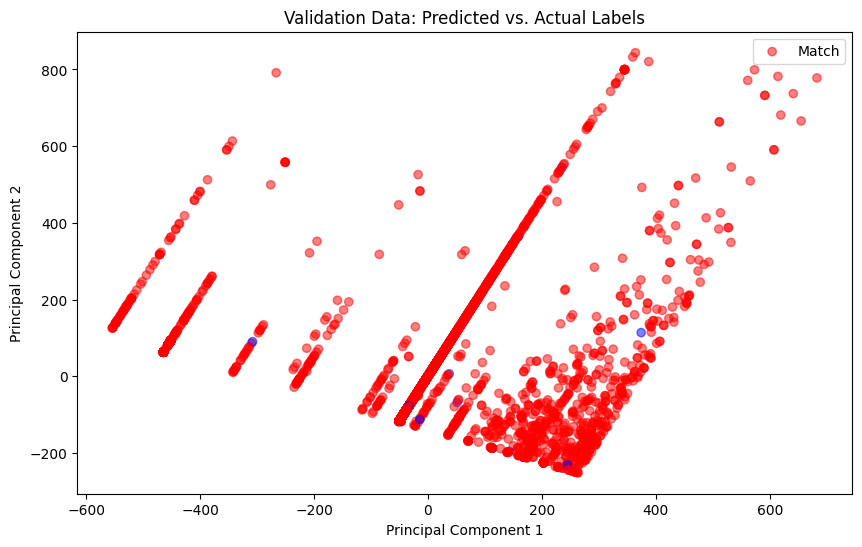

In [69]:
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# NaN 값을 평균 값으로 대체하는 Imputer 생성
imputer = SimpleImputer(strategy='mean')

# Imputer를 사용하여 NaN 값을 대체
valid_x_imputed = imputer.fit_transform(valid_x)

# PCA를 사용하여 데이터를 2차원으로 축소
pca = PCA(n_components=2)
valid_x_reduced = pca.fit_transform(valid_x_imputed)

# 예측된 레이블과 실제 레이블을 기반으로 색상 지정
colors = ['red' if y_true == y_pred else 'blue' for y_true, y_pred in zip(valid_y, val_preds)]

# 축소된 데이터 포인트 시각화
plt.figure(figsize=(10, 6))
plt.scatter(valid_x_reduced[:, 0], valid_x_reduced[:, 1], c=colors, alpha=0.5)
plt.title('Validation Data: Predicted vs. Actual Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(['Match', 'Missmatch'], loc='best')
plt.show()

In [70]:
pd.options.display.max_rows = 60
pd.options.display.max_columns = 50

In [71]:
misclassified_indices = np.where(valid_y != val_preds)[0]  # 잘못 분류된 행의 인덱스

# 잘못 예측한 행 출력
print("잘못 예측한 행의 인덱스:", misclassified_indices)
misclassified_samples = df_train.iloc[misclassified_indices]  # 잘못 예측한 행에 대한 샘플
misclassified_samples

잘못 예측한 행의 인덱스: [ 176  177  203  303  319  353  652  741  742  978  993 1128 1167 1364
 1365 1396 1397 1414 1422 1427 1428 1432 1546 1554 1563 1564 1566 1568
 1569 1571 1575 1578 1581 1582 1720 1796 1825 1975 2125 2277 2454 2465
 2631 2698 3455 3462 3694 3761 3938 3973 3974 3991 3993 3994 4075 4103
 4177 4392 4582 4641 4732 4759]


,enterprise,lead_desc_length,bant_submit,id_strategic_ver,it_strategic_ver,idit_strategic_ver,ver_cus,ver_pro,historical_existing_cnt,com_reg_ver_win_rate,ver_win_rate_x,ver_win_ratio_per_bu,is_converted,business_unit_AS,business_unit_CM,business_unit_ID,business_unit_IT,business_unit_Solution,p_country_consistency,p_bant_historical_interaction,p_interaction_fulfillment_ratio,p_customer_type_product_category_freq,p_business_area_country_success_freq,p_inverse_historical_interaction,p_sqrt_lead_desc_length,p_product_info_detail,log_historical_existing_cnt,customer_type_freq,customer_country_conversion_rate,customer_idx_conversion_rate,customer_type_conversion_rate,customer_job_conversion_rate,customer_position_conversion_rate,lead_owner_conversion_rate,expected_timeline_conversion_rate,product_category_conversion_rate,product_subcategory_conversion_rate,product_modelname_conversion_rate,inquiry_type_conversion_rate,business_unit_conversion_rate,customer_country.1_conversion_rate,business_area_conversion_rate,business_subarea_conversion_rate,p_customer_type_product_category_conversion_rate,p_business_area_country_success_conversion_rate,p_customer_demand_fulfillment,p_product_interest_by_job,p_business_unit_success_by_region,p_ver_business_interaction
176,0,111,0.50,0,0,0,0,0,0.0,0.066667,0.003079,0.026846,0,1,0,0,0,0,1,0.0,0.405465,0.014014,105.0,1.000000,10.535654,1,0.000000,0.741513,0.091547,0.000000,0.065862,0.074146,0.125525,0.038298,0.074248,0.056087,0.070602,0.000000,0.092509,0.055825,0.091547,0.065414,0.129775,0.078219,0.133333,0.0,0.004159,0.005111,0.000172
177,0,71,0.50,0,0,0,1,0,0.0,0.066667,0.003079,0.026846,0,1,0,0,0,0,1,0.0,0.405465,0.012125,105.0,1.000000,8.426150,1,0.000000,0.179615,0.091547,0.000000,0.137827,0.074146,0.125525,0.038298,0.095348,0.045590,0.093030,0.081555,0.092509,0.055825,0.091547,0.065414,0.148148,0.029207,0.133333,0.0,0.003380,0.005111,0.000172
203,0,50,0.50,0,0,0,0,0,0.0,0.088889,0.003079,0.026846,0,1,0,0,0,0,1,0.0,0.405465,0.040709,547.0,1.000000,7.071068,1,0.000000,0.741513,0.071682,0.000000,0.065862,0.084857,0.085560,0.230769,0.090360,0.087915,0.095597,0.070782,0.025048,0.055825,0.071682,0.065414,0.136498,0.102734,0.080439,0.0,0.007460,0.004002,0.000172
303,1,11,0.50,0,0,0,0,0,47.0,0.066667,0.003079,0.026846,0,1,0,0,0,0,1,23.5,19.462325,0.000051,38.0,0.020833,3.316625,1,3.871201,0.023070,0.114537,0.333333,0.121345,0.083235,0.085560,0.000000,0.095348,0.056087,0.155193,0.125240,0.092509,0.055825,0.114537,0.065414,0.164629,0.333333,0.052632,0.0,0.004668,0.006394,0.000172
319,1,302,1.00,0,0,0,1,0,0.0,0.040816,0.003079,0.026846,0,1,0,0,0,0,1,0.0,0.693147,0.012125,24.0,1.000000,17.378147,1,0.000000,0.179615,0.089552,0.000000,0.137827,0.095648,0.100109,0.018182,0.042763,0.045590,0.128930,0.133954,0.092509,0.055825,0.089552,0.065414,0.128788,0.029207,0.041667,0.0,0.004361,0.004999,0.000172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4392,0,7,0.75,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,1,0.0,0.559616,0.102919,NaN,1.000000,2.645751,1,0.000000,0.741513,0.071682,0.000000,0.065862,0.083449,0.085560,0.009726,0.095348,0.042086,0.071429,0.034091,0.031802,0.102492,0.071682,0.063115,0.146417,0.041783,0.042360,0.0,0.003512,0.007347,0.000000
4582,0,17,1.00,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,1,0.0,0.693147,0.262298,NaN,1.000000,4.123106,0,0.000000,0.741513,0.071682,0.000000,0.065862,0.025170,0.085560,0.000000,0.095348,0.027475,0.033075,0.000000,0.092509,0.102492,0.071682,0.059778,0.174118,0.026103,0.056891,0.0,0.000692,0.007347,0.000000
4641,0,32,1.00,0,0,0,0,0,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,1,0.0,0.693147,0.012496,NaN,1.000000,5.656854,1,0.000000,0.741513,0.071682,0.000000,0.065862,0.086382,0.085560,0.009726,0.095348,0.027344,0.042643,0.063561,0.031802,0.102492,0.071682,0.063115,0.174118,0.025641,0.042360,0.0,0.00

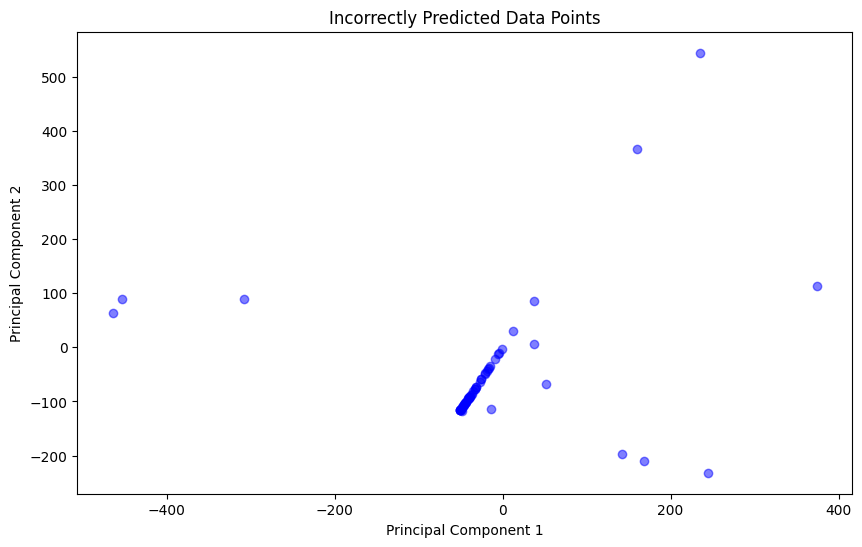

In [72]:
# 잘못 예측한 데이터 포인트만 선택
incorrect_points = valid_x_reduced[misclassified_indices, :]

# 잘못 예측한 데이터 포인트 시각화
plt.figure(figsize=(10, 6))
plt.scatter(incorrect_points[:, 0], incorrect_points[:, 1], c='blue', alpha=0.5)
plt.title('Incorrectly Predicted Data Points')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

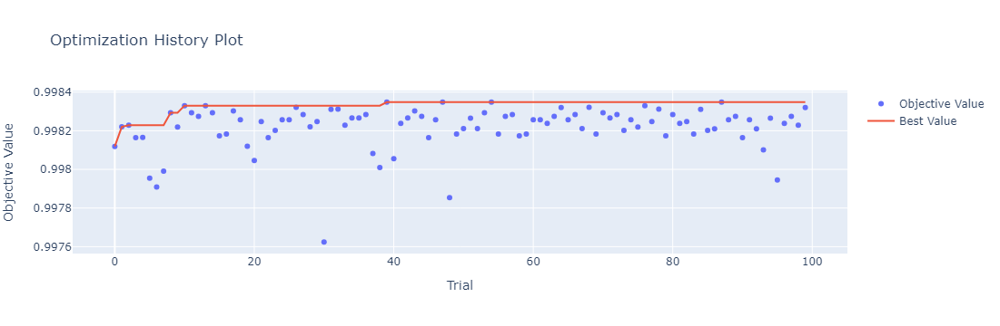

In [73]:
import optuna.visualization as vis

# 목적 함수 값의 변화를 시각화
vis.plot_optimization_history(study)

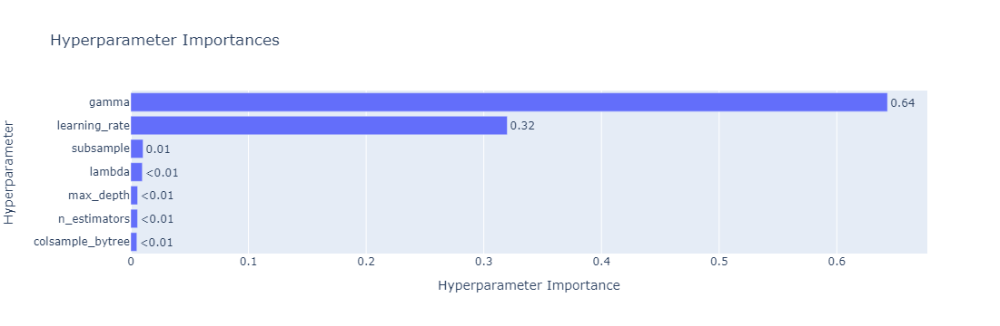

In [74]:
# 각 하이퍼파라미터의 중요도를 시각화
vis.plot_param_importances(study)

In [75]:
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, precision_score, f1_score, cohen_kappa_score, matthews_corrcoef, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate metrics
accuracy = accuracy_score(valid_y, val_preds)
auc = roc_auc_score(valid_y, val_preds)
recall = recall_score(valid_y, val_preds)
precision = precision_score(valid_y, val_preds)
f1 = f1_score(valid_y, val_preds)
kappa = cohen_kappa_score(valid_y, val_preds)
mcc = matthews_corrcoef(valid_y, val_preds)

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'AUC: {auc}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')
print(f'F1 Score: {f1}')
print(f'Kappa: {kappa}')
print(f'MCC: {mcc}')

ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

In [ ]:
# Confusion matrix
cm = confusion_matrix(valid_y, val_preds)

# Plot confusion matrix
plt.figure(figsize=(18, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

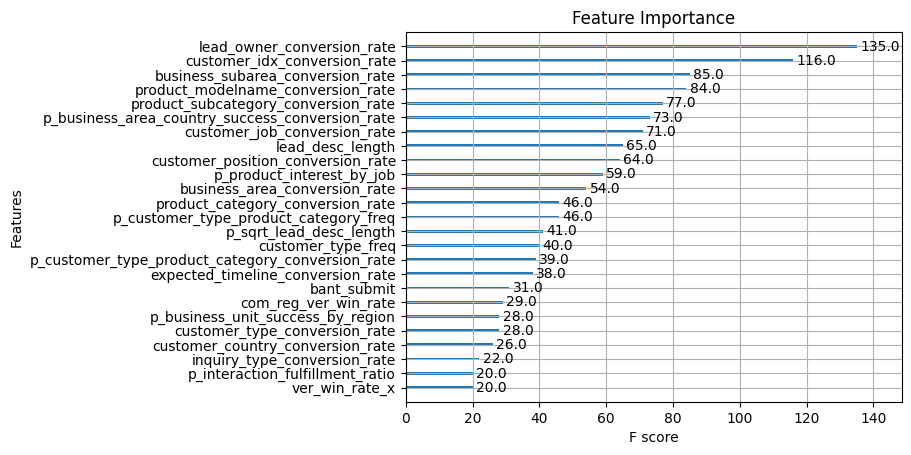

In [76]:
from xgboost import plot_importance

# Plot feature importance
plot_importance(best_model, max_num_features=25)  # Show top 10 features
plt.title('Feature Importance')
plt.show()

In [77]:
import pandas as pd
import matplotlib.pyplot as plt

# 최적의 모델에서 feature importance 추출
feature_importances = best_model.get_booster().get_score(importance_type="weight")

# feature importance를 데이터 프레임으로 변환
df_feature_importances = pd.DataFrame({'feature': list(feature_importances.keys()),
                                       'importance': list(feature_importances.values())})

# feature importance를 중요도 순으로 정렬
df_feature_importances.sort_values(by='importance', ascending=False, inplace=True)
df_feature_importances

,feature,importance
28,lead_owner_conversion_rate,135.0
24,customer_idx_conversion_rate,116.0
36,business_subarea_conversion_rate,85.0
32,product_modelname_conversion_rate,84.0
31,product_subcategory_conversion_rate,77.0
38,p_business_area_country_success_conversion_rate,73.0
26,customer_job_conversion_rate,71.0
1,lead_desc_length,65.0
27,customer_position_conversion_rate,64.0
39,p_product_interest_by_job,59.0


# 테스트 데이터

In [78]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59299 entries, 0 to 59298
Data columns (total 49 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   enterprise                                        59299 non-null  int64  
 1   lead_desc_length                                  59299 non-null  int64  
 2   bant_submit                                       59299 non-null  float64
 3   id_strategic_ver                                  59299 non-null  int64  
 4   it_strategic_ver                                  59299 non-null  int64  
 5   idit_strategic_ver                                59299 non-null  int64  
 6   ver_cus                                           59299 non-null  int64  
 7   ver_pro                                           59299 non-null  int64  
 8   historical_existing_cnt                           59299 non-null  float64
 9   com_reg_ver_win_r

In [79]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5271 entries, 0 to 5270
Data columns (total 49 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   enterprise                                        5271 non-null   int64  
 1   lead_desc_length                                  5271 non-null   int64  
 2   bant_submit                                       5271 non-null   float64
 3   id_strategic_ver                                  5271 non-null   int64  
 4   it_strategic_ver                                  5271 non-null   int64  
 5   idit_strategic_ver                                5271 non-null   int64  
 6   ver_cus                                           5271 non-null   int64  
 7   ver_pro                                           5271 non-null   int64  
 8   historical_existing_cnt                           5271 non-null   float64
 9   com_reg_ver_win_rat

In [80]:
x_test = df_test.drop(['is_converted'], axis =1)

In [81]:
# 예측에 필요한 데이터 분리
#x_test = df_test.drop(["is_converted"], axis=1)


# 학습 및 검증 데이터에 transform 적용
X_test_scaled = scaler.transform(X_train_encoded)

NameError: name 'X_train_encoded' is not defined

In [82]:
x_test.shape

(5271, 48)

In [83]:
# 예측에 필요한 데이터 분리
#x_test_1 = x_test.drop(['customer_idx_conversion_rate'], axis=1)

In [84]:
# PyCaret 모델을 사용하여 테스트 데이터에 대한 예측 수행
test_predictions = best_model.predict(x_test)

In [85]:
test_predictions

array([1, 1, 1, ..., 0, 1, 1])

In [67]:
test_pred = test_predictions == 1

In [68]:
test_pred

array([False,  True,  True, ..., False, False, False])

In [69]:
sum(test_pred == True)

944

# 예측 결과에서 라벨 추출 (PyCaret에서는 예측 라벨이 'Label' 컬럼에 저장됩니다)
test_pred = test_predictions['prediction_label'].apply(lambda x: True if x == 1 else False)

In [70]:
# True로 예측된 개수
num_true_predictions = sum(test_pred == 1)
print(f"Number of True predictions: {num_true_predictions}")

Number of True predictions: 944


In [59]:
# 제출 데이터 로드 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")

In [60]:
# 예측 결과를 'is_converted' 컬럼에 저장
df_sub["is_converted"] = test_pred

In [61]:
# 제출 파일 저장
df_sub.to_csv("submission.csv", index=False)
# 파일 저장 완료 메시지 출력
print("Submission file has been saved.")

Submission file has been saved.


In [22]:
# 제출 데이터 로드 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")

In [23]:
tt = pd.read_csv('./ss/final_weighted_predictions.csv')

In [24]:
df_sub["is_converted"] = tt['is_converted']

In [25]:
# 제출 파일 저장
df_sub.to_csv("submission.csv", index=False)
# 파일 저장 완료 메시지 출력
print("Submission file has been saved.")

Submission file has been saved.


In [21]:
df_sub

,id,bant_submit,customer_country,business_unit,com_reg_ver_win_rate,customer_idx,customer_type,enterprise,historical_existing_cnt,id_strategic_ver,...,response_corporate,expected_timeline,ver_cus,ver_pro,ver_win_rate_x,ver_win_ratio_per_bu,business_area,business_subarea,lead_owner,is_converted
0,19844,0.00,/ / Brazil,ID,0.073248,47466,End Customer,Enterprise,53.0,NaN,...,LGESP,NaN,1,0,0.001183,0.049840,retail,Electronics & Telco,278,False
1,9738,0.25,400 N State Of Franklin Rd Cloud IT / Johnson...,IT,NaN,5405,End Customer,SMB,NaN,NaN,...,LGEUS,NaN,0,0,0.000013,NaN,transportation,Others,437,True
2,8491,1.00,/ / U.A.E,ID,NaN,13597,Specifier/ Influencer,SMB,NaN,NaN,...,LGEGF,less than 3 months,0,0,0.000060,0.131148,hospital & health care,General Hospital,874,True
3,19895,0.50,/ Madison / United States,ID,0.118644,17204,NaN,Enterprise,NaN,NaN,...,LGEUS,more than a year,0,0,0.001183,0.049840,retail,NaN,194,False
4,10465,1.00,/ Sao Paulo / Brazil,ID,0.074949,2329,End Customer,Enterprise,2.0,1.0,...,LGESP,less than 3 months,1,1,0.003079,0.064566,corporate / office,Engineering,167,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5266,13855,0.50,/São Paulo/Brazil,AS,NaN,40292,NaN,Enterprise,10.0,NaN,...,LGESP,NaN,0,0,NaN,NaN,NaN,NaN,97,False
5267,7979,0.25,General / / United States,IT,NaN,47466,NaN,Enterprise,0.0,NaN,...,LGEUS,NaN,0,0,NaN,NaN,NaN,NaN,438,True
5268,12887,0.75,/ OURO BRANCO / Brazil,AS,NaN,46227,Specifier/ Influencer,Enterprise,NaN,NaN,...,LGESP,less than 3 months,0,0,NaN,NaN,NaN,NaN,97,False
5269,17530,0.00,/ / Germany,IT,NaN,45667,End Customer,SMB,NaN,NaN,...,LGEDG,NaN,0,0,NaN,NaN,NaN,NaN,429,True
